# TASK 1:MOVIE GENRE CLASSIFICATION
[Kaggle Dataset](https://www.kaggle.com/datasets/hijest/genre-classification-dataset-imdb)


In [2]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import LabelEncoder
from sklearn.svm import LinearSVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report


In [3]:

train_df = pd.read_csv(r"C:\Users\praja\OneDrive\Documents\Genre Classification Dataset\train_data.txt", sep=':::', names=['ID', 'TITLE', 'GENRE', 'DESCRIPTION'], engine='python')
test_df = pd.read_csv(r"C:\Users\praja\OneDrive\Documents\Genre Classification Dataset\test_data.txt", sep=':::', names=['ID', 'TITLE', 'DESCRIPTION'], engine='python')
test_solution_df = pd.read_csv(r"C:\Users\praja\OneDrive\Documents\Genre Classification Dataset\test_data_solution.txt", sep=':::', names=['ID', 'TITLE', 'GENRE', 'DESCRIPTION'], engine='python')

In [4]:
## View train data 
print("shape",train_df.shape)
display(train_df.head())

shape (54214, 4)


,ID,TITLE,GENRE,DESCRIPTION
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...


In [5]:
## View the test solution data 
print("shape",test_solution_df.shape)
display(test_solution_df.head())

shape (54200, 4)


,ID,TITLE,GENRE,DESCRIPTION
0,1,Edgar's Lunch (1998),thriller,"L.R. Brane loves his life - his car, his apar..."
1,2,La guerra de papá (1977),comedy,"Spain, March 1964: Quico is a very naughty ch..."
2,3,Off the Beaten Track (2010),documentary,One year in the life of Albin and his family ...
3,4,Meu Amigo Hindu (2015),drama,"His father has died, he hasn't spoken with hi..."
4,5,Er nu zhai (1955),drama,Before he was known internationally as a mart...


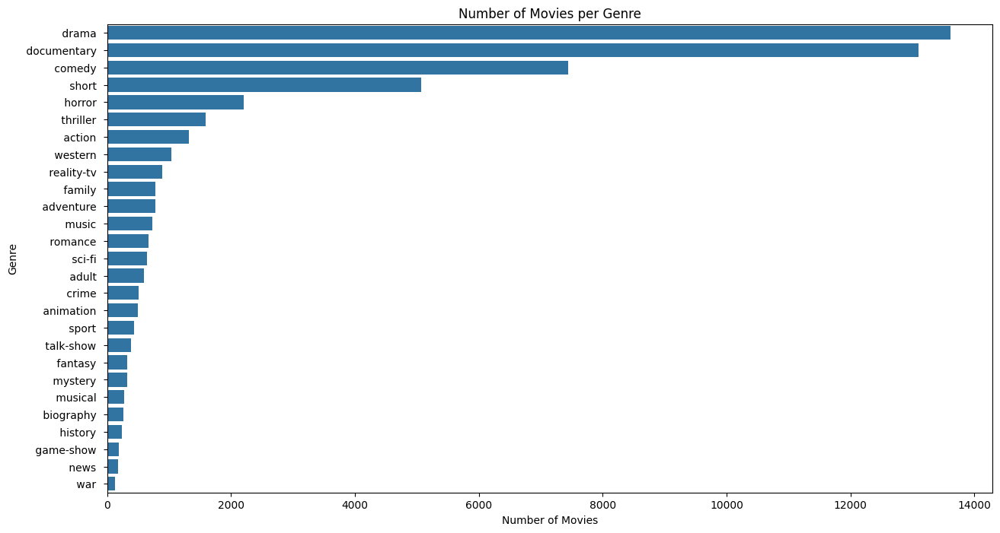

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns

# Genre distribution
plt.figure(figsize=(15, 8))
sns.countplot(y=train_df['GENRE'], order=train_df['GENRE'].value_counts().index)
plt.title('Number of Movies per Genre')
plt.xlabel('Number of Movies')
plt.ylabel('Genre')
plt.show()



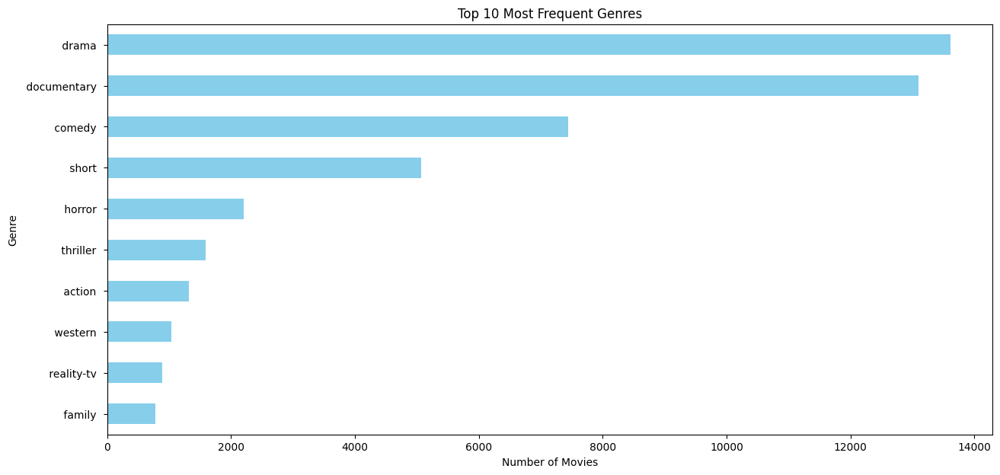

In [7]:
top_genres = train_df['GENRE'].value_counts().head(10)

plt.figure(figsize=(15, 7))
top_genres.plot(kind='barh', color='skyblue')
plt.title('Top 10 Most Frequent Genres')
plt.xlabel('Number of Movies')
plt.ylabel('Genre')
plt.gca().invert_yaxis()  # Invert y-axis to have the genre with the most movies at the top
plt.show()


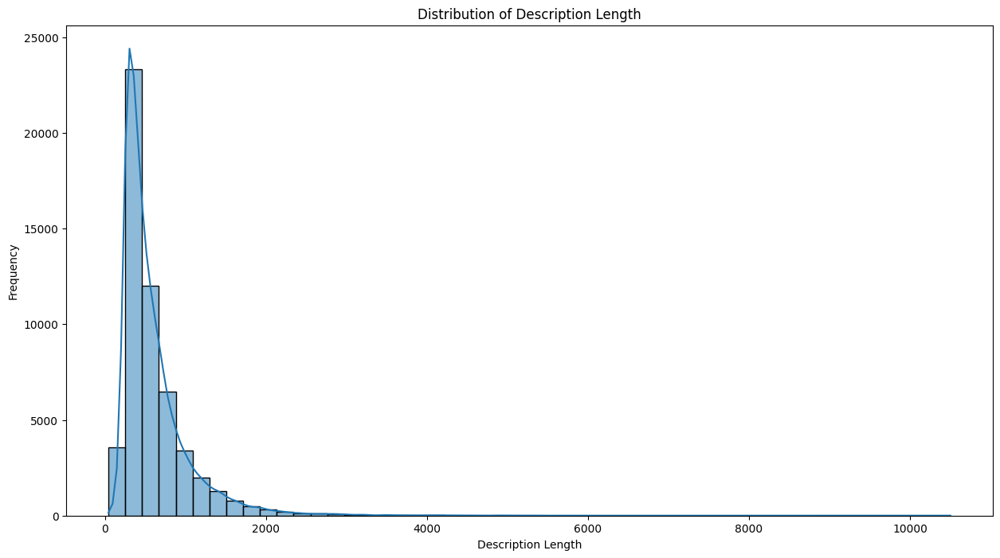

In [8]:
train_df['description_length'] = train_df['DESCRIPTION'].apply(len)

plt.figure(figsize=(15, 8))
sns.histplot(train_df['description_length'], bins=50, kde=True)
plt.title('Distribution of Description Length')
plt.xlabel('Description Length')
plt.ylabel('Frequency')
plt.show()


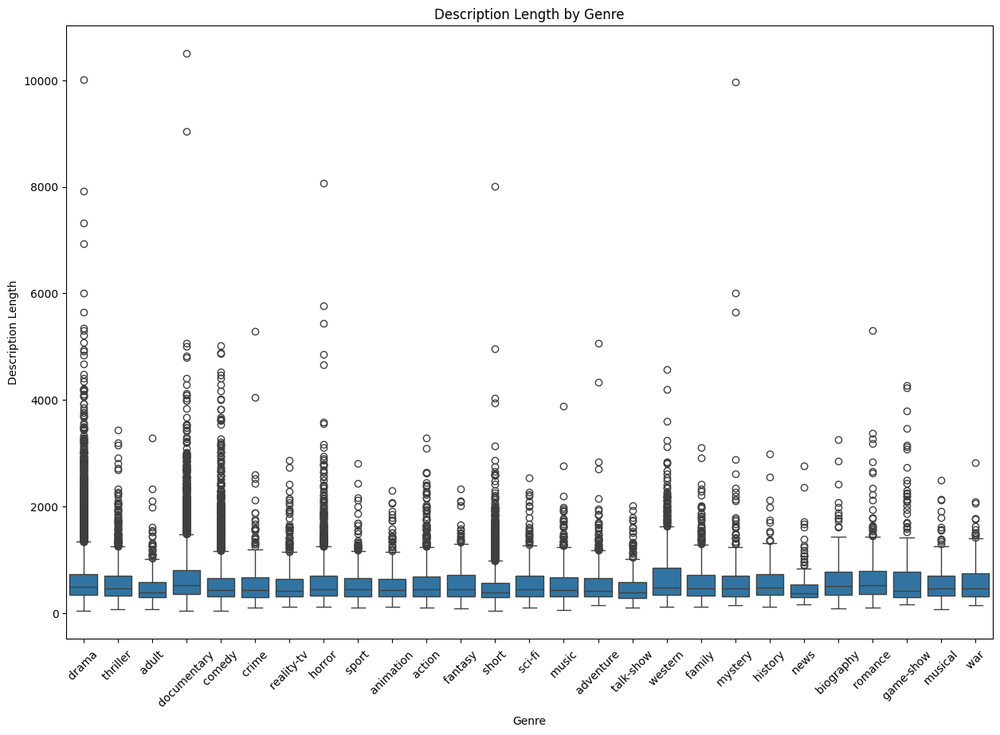

In [9]:
plt.figure(figsize=(15, 10))
sns.boxplot(x='GENRE', y='description_length', data=train_df)
plt.title('Description Length by Genre')
plt.xticks(rotation=45)
plt.xlabel('Genre')
plt.ylabel('Description Length')
plt.show()


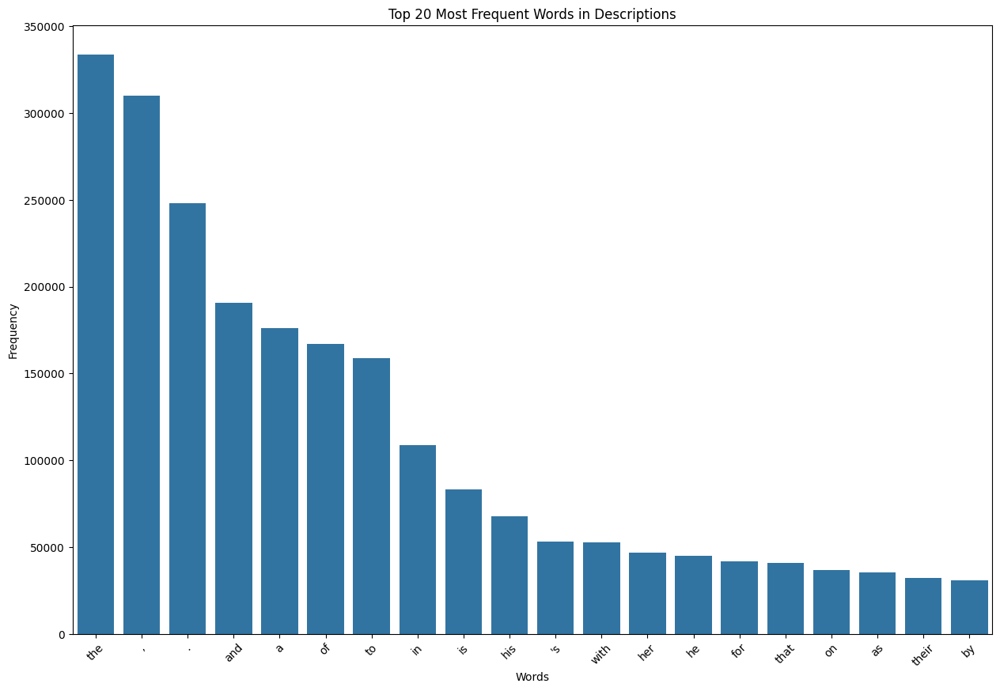

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from nltk.tokenize import word_tokenize

words = ' '.join(train_df['DESCRIPTION']).lower()
tokenized_words = word_tokenize(words)
word_freq = Counter(tokenized_words)

# Extract top 20 most common words
top_words = word_freq.most_common(20)

# Extract the words and their frequencies separately
top_words_words = [word[0] for word in top_words]
top_words_freq = [word[1] for word in top_words]

# Plotting
plt.figure(figsize=(15, 10))
sns.barplot(x=top_words_words, y=top_words_freq)
plt.xticks(rotation=45)
plt.title('Top 20 Most Frequent Words in Descriptions')
plt.xlabel('Words')
plt.ylabel('Frequency')
plt.show()


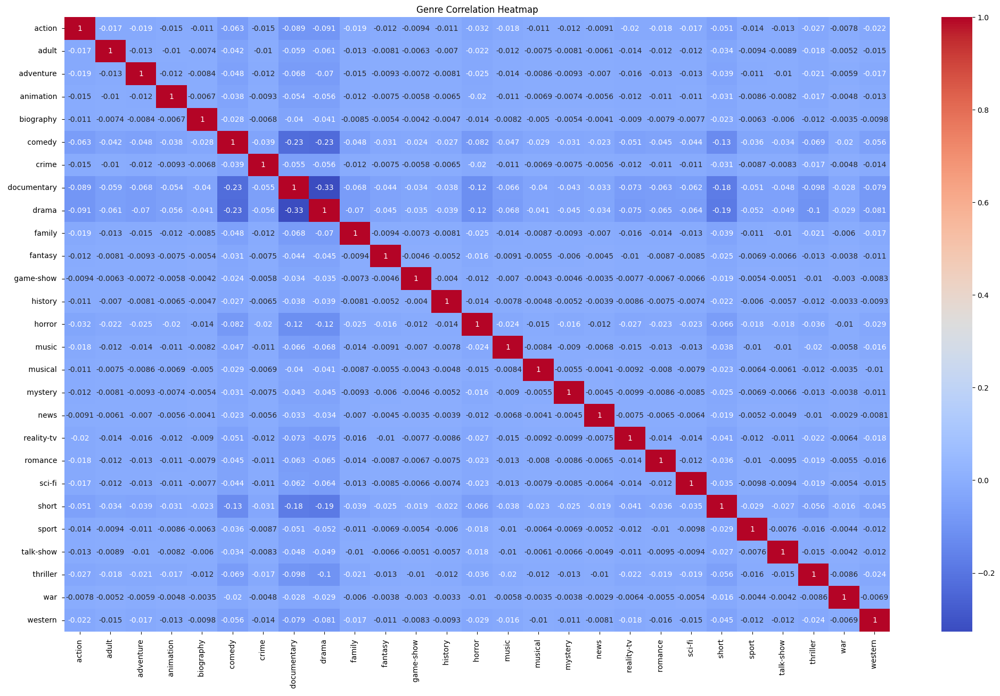

In [11]:
from sklearn.preprocessing import MultiLabelBinarizer

# Assuming the genres are separated by a comma for movies with multiple genres.
train_df['GENRE_list'] = train_df['GENRE'].str.split(',')

mlb = MultiLabelBinarizer()
genres_binarized = pd.DataFrame(mlb.fit_transform(train_df['GENRE_list']), columns=mlb.classes_)

# Compute the correlation matrix for genres
correlation = genres_binarized.corr()

plt.figure(figsize=(25, 15))
sns.heatmap(correlation, annot=True, cmap='coolwarm')
plt.title('Genre Correlation Heatmap')
plt.show()


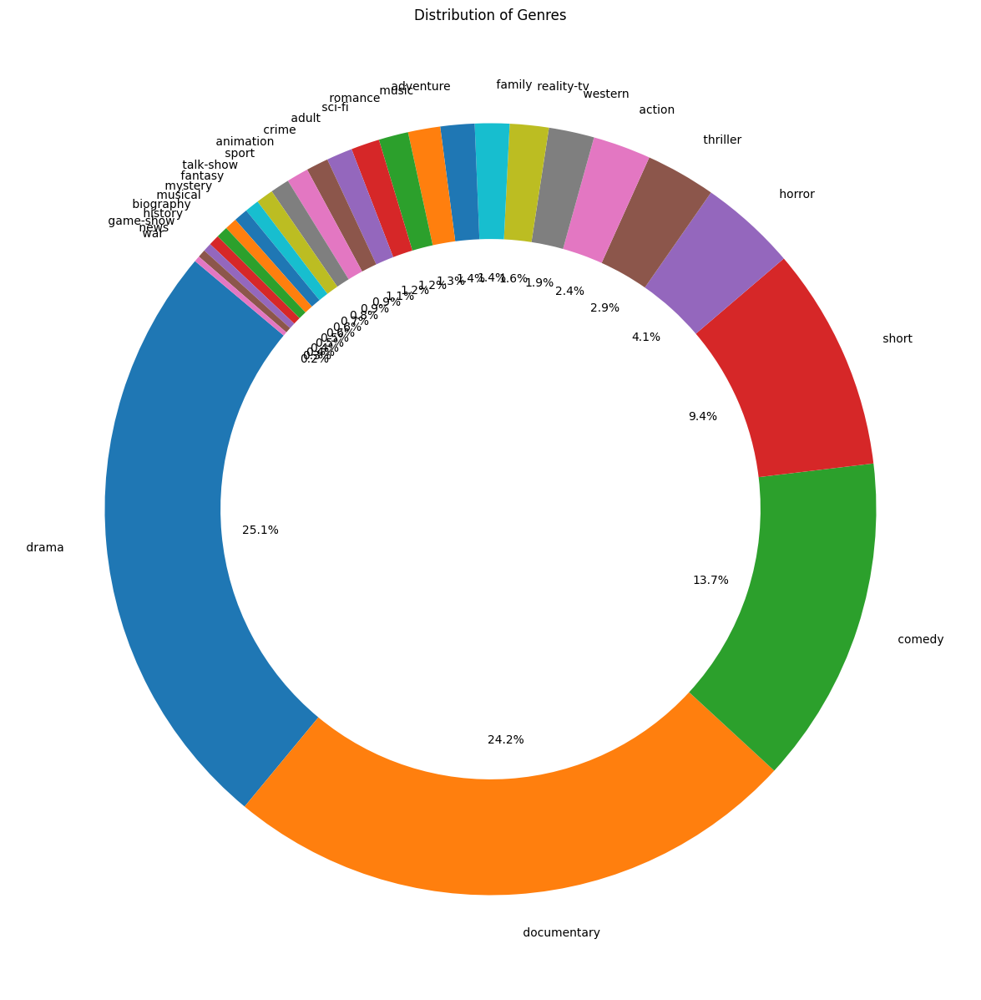

In [12]:
genre_counts = train_df['GENRE'].value_counts()

plt.figure(figsize=(20, 15))
plt.pie(genre_counts, labels=genre_counts.index, startangle=140, autopct='%1.1f%%', wedgeprops=dict(width=0.3))
plt.title('Distribution of Genres')
plt.show()


In [13]:
pip install textblob

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.0 -> 24.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


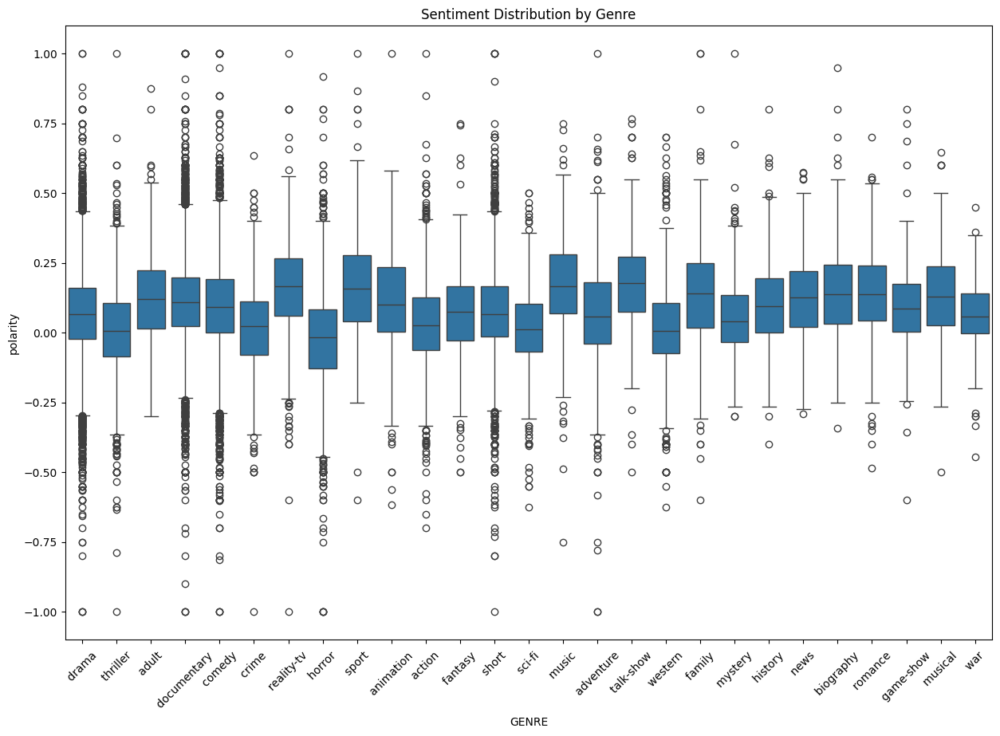

In [14]:
from textblob import TextBlob

train_df['polarity'] = train_df['DESCRIPTION'].apply(lambda x: TextBlob(x).sentiment.polarity)

plt.figure(figsize=(15,10))
sns.boxplot(data=train_df, x='GENRE', y='polarity')
plt.xticks(rotation=45)
plt.title('Sentiment Distribution by Genre')
plt.show()


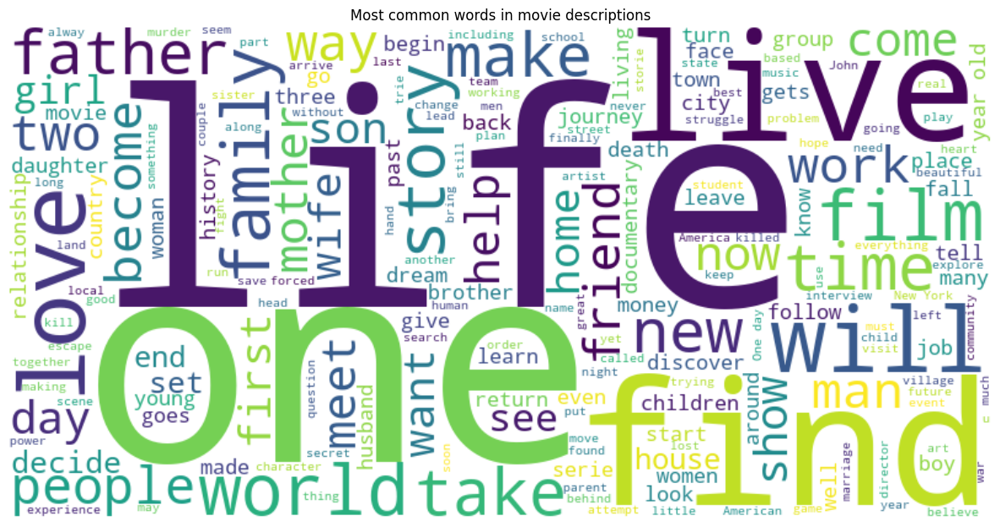

In [15]:
from wordcloud import WordCloud

# Combine all descriptions into one large text
text = ' '.join(description for description in train_df['DESCRIPTION'])

# Create a word cloud
wordcloud = WordCloud(background_color="white", width=800, height=400).generate(text)

plt.figure(figsize=(15, 10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Most common words in movie descriptions')
plt.show()


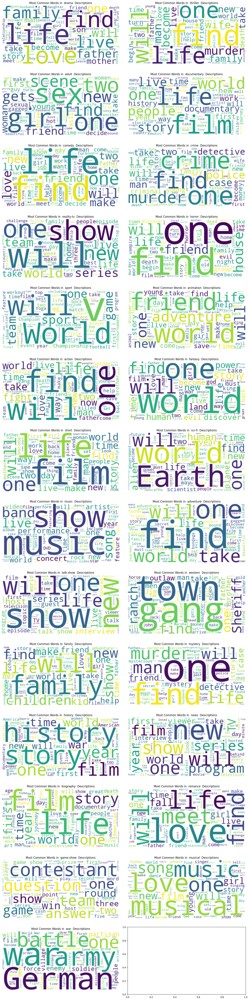

In [16]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Get a list of all unique genres
genres = train_df['GENRE'].unique()

# Set up the figure
n_rows = 14
n_cols = 2
fig, ax = plt.subplots(n_rows, n_cols, figsize=(15, 60))  # Adjust size based on your requirement

for i, genre in enumerate(genres, start=1):
    plt.subplot(n_rows, n_cols, i)
    
    # Filter descriptions by genre
    genre_text = ' '.join(description for description in train_df[train_df['GENRE'] == genre]['DESCRIPTION'])

    # Generate word cloud
    wordcloud = WordCloud(background_color="white", width=400, height=200, max_words=100).generate(genre_text)

    # Plot the word cloud
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Most Common Words in {genre} Descriptions')

plt.tight_layout()
plt.show()


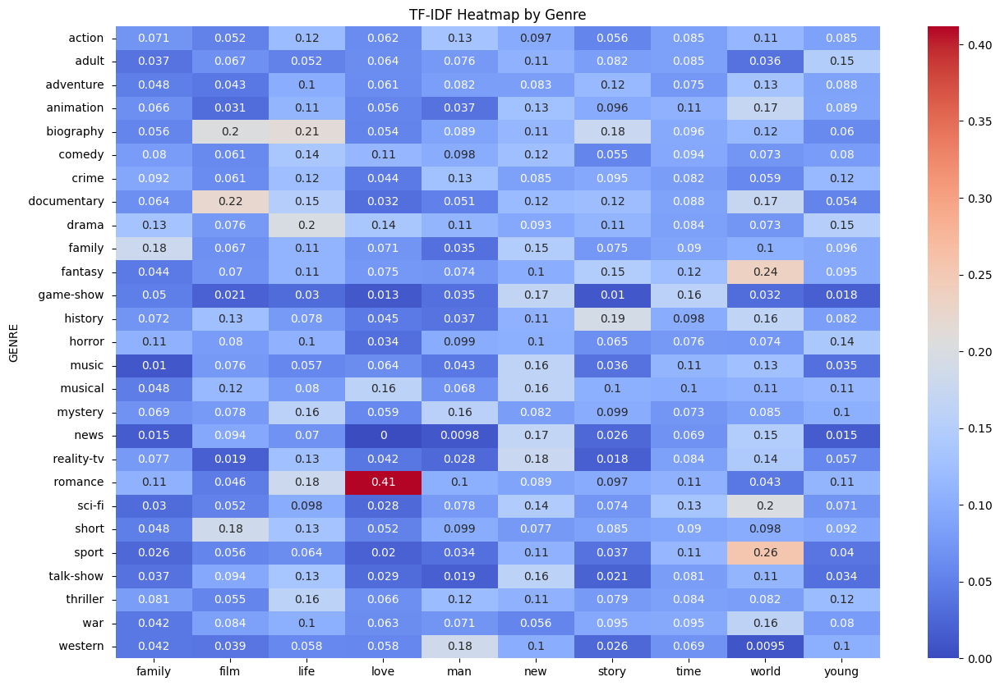

In [17]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf = TfidfVectorizer(max_df=0.85, max_features=10, stop_words='english')
tfidf_matrix = tfidf.fit_transform(train_df['DESCRIPTION'])

tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf.get_feature_names_out())
genre_tfidf = train_df[['GENRE']].join(tfidf_df)

plt.figure(figsize=(15,10))
sns.heatmap(genre_tfidf.groupby('GENRE').mean(),annot=True, cmap='coolwarm')
plt.title('TF-IDF Heatmap by Genre')
plt.show()


In [18]:
# Handle any potential missing values
train_df['DESCRIPTION'].fillna("", inplace=True)
test_df['DESCRIPTION'].fillna("", inplace=True)

tfidf_vectorizer = TfidfVectorizer(stop_words='english', max_features=10000)
X_train = tfidf_vectorizer.fit_transform(train_df['DESCRIPTION'])
X_test = tfidf_vectorizer.transform(test_df['DESCRIPTION'])

label_encoder = LabelEncoder()
y_train = label_encoder.fit_transform(train_df['GENRE'])
y_test = label_encoder.transform(test_solution_df['GENRE'])


C:\Users\praja\AppData\Local\Temp\ipykernel_152480\558017716.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  train_df['DESCRIPTION'].fillna("", inplace=True)
C:\Users\praja\AppData\Local\Temp\ipykernel_152480\558017716.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For exa

In [19]:
# Split training data into train and validation subsets
X_train_sub, X_val, y_train_sub, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

clf = LinearSVC()
clf.fit(X_train_sub, y_train_sub)

y_val_pred = clf.predict(X_val)
print("Validation Accuracy:", accuracy_score(y_val, y_val_pred))
print("Validation Classification Report:\n", classification_report(y_val, y_val_pred))


Validation Accuracy: 0.5663561744904547
Validation Classification Report:
               precision    recall  f1-score   support

           0       0.42      0.34      0.38       263
           1       0.69      0.46      0.55       112
           2       0.40      0.24      0.30       139
           3       0.38      0.17      0.24       104
           4       0.00      0.00      0.00        61
           5       0.51      0.57      0.54      1443
           6       0.25      0.07      0.12       107
           7       0.69      0.80      0.74      2659
           8       0.56      0.69      0.62      2697
           9       0.29      0.15      0.20       150
          10       0.13      0.03      0.04        74
          11       0.76      0.65      0.70        40
          12       0.00      0.00      0.00        45
          13       0.62      0.65      0.63       431
          14       0.56      0.54      0.55       144
          15       0.10      0.02      0.03        50
      

In [20]:
y_pred = clf.predict(X_test)
print("Test Accuracy:", accuracy_score(y_test, y_pred))
print("Test Classification Report:\n", classification_report(y_test, y_pred))


Test Accuracy: 0.5664575645756458
Test Classification Report:
               precision    recall  f1-score   support

           0       0.39      0.31      0.35      1314
           1       0.58      0.37      0.45       590
           2       0.40      0.22      0.28       775
           3       0.34      0.14      0.20       498
           4       0.00      0.00      0.00       264
           5       0.52      0.57      0.55      7446
           6       0.26      0.08      0.12       505
           7       0.69      0.80      0.74     13096
           8       0.56      0.70      0.62     13612
           9       0.30      0.15      0.20       783
          10       0.21      0.06      0.09       322
          11       0.76      0.60      0.67       193
          12       0.15      0.02      0.03       243
          13       0.60      0.61      0.60      2204
          14       0.58      0.50      0.54       731
          15       0.27      0.08      0.12       276
          16      

In [21]:
from sklearn.naive_bayes import MultinomialNB

nb_classifier = MultinomialNB()
nb_classifier.fit(X_train, y_train)


MultinomialNB()

In [22]:
from sklearn.linear_model import LogisticRegression

lr_classifier = LogisticRegression(max_iter=1000)
lr_classifier.fit(X_train, y_train)


LogisticRegression(max_iter=1000)

In [23]:
from sklearn.metrics import accuracy_score, classification_report

y_pred_nb = nb_classifier.predict(X_test)
print("Naive Bayes Accuracy:", accuracy_score(y_test, y_pred_nb))
print(classification_report(y_test, y_pred_nb))

y_pred_lr = lr_classifier.predict(X_test)
print("Logistic Regression Accuracy:", accuracy_score(y_test, y_pred_lr))
print(classification_report(y_test, y_pred_lr))


Naive Bayes Accuracy: 0.5215313653136532
              precision    recall  f1-score   support

           0       0.60      0.06      0.11      1314
           1       0.54      0.05      0.10       590
           2       0.81      0.07      0.13       775
           3       0.00      0.00      0.00       498
           4       0.00      0.00      0.00       264
           5       0.53      0.43      0.48      7446
           6       0.00      0.00      0.00       505
           7       0.57      0.88      0.69     13096
           8       0.46      0.84      0.59     13612
           9       0.00      0.00      0.00       783
          10       0.00      0.00      0.00       322
          11       0.97      0.19      0.31       193
          12       0.00      0.00      0.00       243
          13       0.73      0.31      0.43      2204
          14       0.95      0.05      0.10       731
          15       0.00      0.00      0.00       276
          16       0.00      0.00      0

c:\Users\praja\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\praja\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\praja\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

              precision    recall  f1-score   support

           0       0.51      0.29      0.37      1314
           1       0.63      0.24      0.35       590
           2       0.65      0.16      0.26       775
           3       0.54      0.05      0.10       498
           4       0.00      0.00      0.00       264
           5       0.54      0.59      0.56      7446
           6       0.37      0.03      0.05       505
           7       0.67      0.86      0.75     13096
           8       0.54      0.78      0.64     13612
           9       0.53      0.09      0.16       783
          10       0.52      0.04      0.08       322
          11       0.91      0.49      0.64       193
          12       0.00      0.00      0.00       243
          13       0.66      0.58      0.62      2204
          14       0.69      0.44      0.54       731
          15       0.42      0.02      0.03       276
          16       0.22      0.01      0.01       318
          17       0.71    

c:\Users\praja\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\praja\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [24]:
def predict_genre(description):
    vec = tfidf_vectorizer.transform([description])
    pred_label = clf.predict(vec)
    return label_encoder.inverse_transform(pred_label)[0]

sample_description = " Four high school students embark on a terrifying journey through ShadowView Manor 2 years after a horrifying séance gone wrong. Intern Raven, decides to reconnect with her elementary school friends Kota, William, and Jessica by bringing them to her new workplace, ShadowView Manor for a bit of paranormal investigating. Hearing more forbidden secrets from the night janitor sends them into a dark descending spiral of terror."

print(predict_genre(sample_description))


 horror 
